<a href="https://colab.research.google.com/github/jolinevb/test/blob/main/AIP_Reg_Exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TM11005 Advanced Image Processing
# Week 2: Registration, Exercise
#### Author: Martijn P. A. Starmans

This exercise will serve as the final test for the registration week. You will have to use the combined knowledge of the four lectures and skills of the two tutorials for this exercise. Two patient cases will be presented, in which you have to find a suitable registration methods:

* Retinography Fundus images
* Multimodal Brain images

**You only need to complete one the two exercises: you are free to pick which one.**

Registration is often challenging, hence a "perfect" solution does not
exist. Random effects in for example the optimization strategy might
alter the result every time you run it. Hence, in the exercises, try to
get a decent result: we leave it up to you when you think that point is
reached.

We expect you to write a short report within this Notebook on what you did, either at the end of the notebook or in between your code blocks, with at the bare minimum describing:
- Methods:
    * Motivation for all registration components, e.g., transformation model(s), metric(s), optimization strategy, resampling, interpolation
    * Use of proper masking
    * Motivation for general registration parameters e.g., MaximumNumberOfIterations, NumberOfResolutions, NumberOfSpatialSamples
- Results:
    * Plots of the original fixed and moving images, and the results
    * Analysis of the metric values
- Discussion and Conclusion

We encourage you to try out multiple options, show these results and discuss them to substantiate your method choices with concrete results.

*The answers/report and the code of exercise you choose has to be handed in on
Brightspace. Make the exercises in this Jupyter notebook and fill in your answers as well, download it as "PDF using LateX" and hand this file in on Brightspace. Hence, make sure the whole script runs without errors. Please remove the parts from the exercise you did not make.*


In [3]:
                                                                              # Install the necessary toolboxes
%reset
!pip install itk-elastix

# Install the toolbox we made for this course
!pip install -q --upgrade git+https://github.com/jveenland/AIP_tools.git

Once deleted, variables cannot be recovered. Proceed (y/[n])? y
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.4/21.4 MB 71.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 68.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.5/28.5 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 85.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 12.2 MB/s eta 0:00:00


In [103]:
# Import the neccesary toolboxes
import aip
import itk
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.color import gray2rgb
import numpy as np
from skimage.morphology import disk, closing, remove_small_objects
import numpy as np
from skimage.draw import disk as dsk
from skimage.measure import label, regionprops
from skimage.filters import frangi
from skimage import img_as_float
from matplotlib import colors
import cv2

# Import datasets
data = aip.list_data_registration()
fundus_data = data['fundus_data']
print(fundus_data)
brain_data = data['brain_data']

# Define an outputfolder for the logging, which we define as a subfolder of this folder
outputfolder = os.path.join(os.getcwd(), 'Output')
if not os.path.exists(outputfolder):
    os.mkdir(outputfolder)

# Set log file name
log_file_name = 'elastix.log'

{'A08_1.nii': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/A08_1.nii', 'S30_2.nii': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/S30_2.nii', 'A08_2.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/A08_2.jpg', 'A01_1.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/A01_1.jpg', 'P06_2.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/P06_2.jpg', 'P12_1.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/P12_1.jpg', 'S59_1.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/S59_1.jpg', 'P06_2.nii': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/P06_2.nii', 'P12_2.nii': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/P12_2.nii', 'S30_2.jpg': '/usr/local/lib/python3.11/dist-packages/aip/data/registration/Fundus/S30_2.jpg', 'P12_2.jpg': '/usr/local/lib/python3.11/dist-pack

## Exercise 1: Fundus image alignment.
# Joline van Barneveld, 5516501

Your goal is to align images of the fundus. The images are 2D images of the
fundus and come in pairs. Each pair belongs to the same patient, but the images were taken at different timepoints. Your task is to find a registration method to align the paired images.

Create one method, e.g. one function that aligns two pairs of images automatically, and pick three pairs to test your method on to show that it generalizes well. Use your knowledge of the general elastix settings, metrics and optimizers to come up with a registration strategy. We also provided you with a mask for the field of view of the images. You may want to make a mask for more specific ROIs, e.g. for the optic disk. You are free to use any preprocessing options or segmentation strategies you would like to use. The images are both provided as nifti and as jpg.

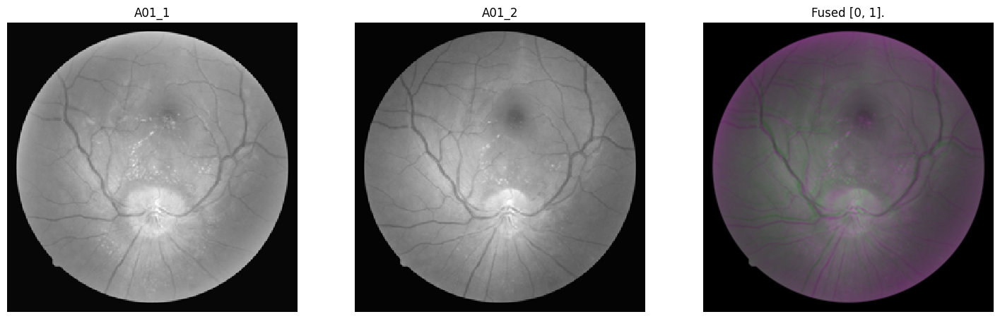

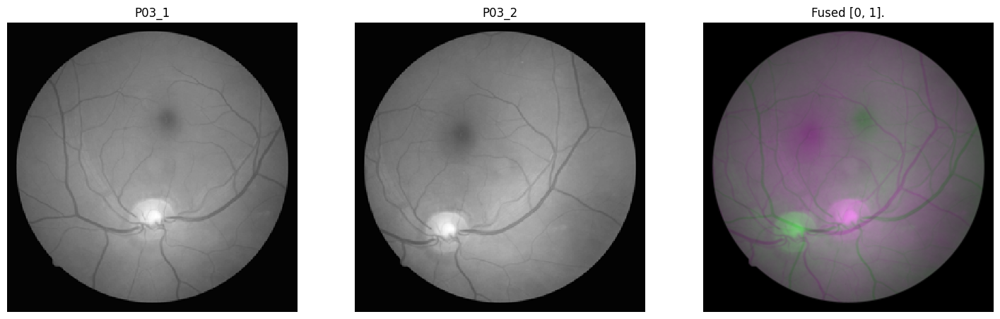

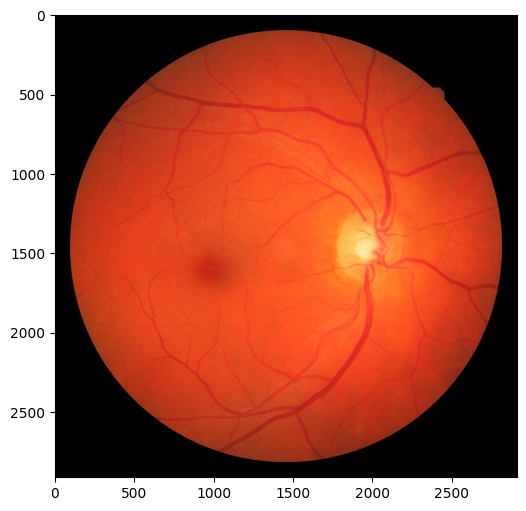

In [5]:
# Two examples of image pairs
A01_1 = itk.imread(fundus_data['A01_1.nii'], itk.F)
A01_2 = itk.imread(fundus_data['A01_2.nii'], itk.F)
aip.reg_tools.show_itkimages([A01_1, A01_2], titles=['A01_1', 'A01_2'], imfuse=[0, 1])

P03_1 = itk.imread(fundus_data['P03_1.nii'], itk.F)
P03_2 = itk.imread(fundus_data['P03_2.nii'], itk.F)
aip.reg_tools.show_itkimages([P03_1, P03_2], titles=['P03_1', 'P03_2'], imfuse=[0, 1])

# Note that we plotted the images in grayscale, but originally they are in color
# Note that the Nifti is a rotated version of the jpg, but this does not matter for the registration
img = mpimg.imread(fundus_data['P03_1.jpg'])
fig = plt.figure(figsize=(6,6))
imgplot = plt.imshow(img)


# Segmentation
In this section, histograms are made to define the threshold for making a mask for the optical disk. This is done by first normalizing the intensities of the image, and thereafter plotting the histogram.

Additionally, morphological operations are tried on the mask, to determine which morphological operation works best to obtain the mask of the optical disk. Closing shows the most accurate results for masking the optical disk.  

### Function for normalization

In [6]:
def normalize_np(image):
    image = image.astype(np.float32)
    image_normalized = (image - np.min(image)) / (np.max(image) - np.min(image))
    return image_normalized

def normalize_itk(image):
    arr = itk.GetArrayFromImage(image)
    arr = (arr - arr.min()) / (arr.max() - arr.min())
    return itk.image_from_array(arr.astype(np.float32))

### Casting an image/ mask to type itk

In [7]:
import itk
import numpy as np

def mask_to_itk(mask, reference_itk):
    """
    Zet een numpy-masker om naar een ITK-image van type unsigned char (UC),
    met overname van geometrie van een referentiebeeld.

    Parameters:
    - mask_np: np.ndarray (binaire masker)
    - reference_itk: itk.Image (beeld waarvan geometrie wordt overgenomen)

    Returns:
    - image_itk_uc: itk.Image[itk.UC, 2]
    """
    if not isinstance(mask, np.ndarray):
        raise TypeError("Input moet een NumPy-array zijn.")

    mask_itk = itk.GetImageFromArray(mask.astype(np.uint8))
    mask_itk.CopyInformation(reference_itk)

    cast_filter = itk.CastImageFilter[
        type(mask_itk),
        itk.Image[itk.UC, mask_itk.GetImageDimension()]
    ].New()
    cast_filter.SetInput(mask_itk)
    cast_filter.Update()

    mask_itk = cast_filter.GetOutput()
    return mask_itk


### Making histograms and trying out morphological operations

In [1]:
# Type your code here
#from aip import reg_tools
#from skimage.morphology import disk, dilation, erosion, opening, closing, flood_fill, remove_small_objects

## Preprocessing
# normalizing the image
#intensity_array = np.array(A01_1)
#print(A01_1.dtype) # defining type of image

#A01_1_normalized = normalize(A01_1)
#A01_2_normalized = normalize(A01_2)
#P03_1_normalized = normalize(P03_1)
#P03_2_normalized = normalize(P03_2)

# histogram of image
#import matplotlib.pyplot as plt

#fig, axs = plt.subplots(2, 2, figsize=(10, 6))

#axs[0, 0].hist(A01_1_normalized.ravel(), bins=40)
#axs[0, 0].set_title('Histogram A01_1')

#axs[0, 1].hist(A01_2_normalized.ravel(), bins=40)
#axs[0, 1].set_title('Histogram A01_2')

#axs[1, 0].hist(P03_1_normalized.ravel(), bins=40)
#axs[1, 0].set_title('Histogram P03_1')

#axs[1, 1].hist(P03_2_normalized.ravel(), bins=40)
#axs[1, 1].set_title('Histogram P03_2')

#plt.tight_layout()
#plt.show()

# mask for the optical disk
#mask = np.zeros(A01_1.shape)
#mask[A01_1_normalized > 0.8] = 1
#A01_1_masked = A01_1_normalized * mask
#A01_2_masked = A01_2_normalized * mask

# testing morphological operations
#selem = disk(6)  # 5 pixels radius; pas aan als nodig

# Pas closing toe
#closed = closing(A01_1_masked, selem)
#opened = opening(A01_1_masked, selem)
#eroded = erosion(A01_1_masked, selem)
#dilated = dilation(A01_1_masked, selem)
#A01_1_closed = closed * A01_1_normalized

#titles = ['Original Image','Mask','Closed','Opened','Eroded','Dilated','Filled']
#reg_tools.show_images([A01_1_normalized,mask,closed,opened,eroded,dilated], cmap='gray', titles=titles)

## dilated is the best. Choosing regions with the highest area, this is the disk.
#binary_closed = A01_1_closed > 0
#binary_cleaned = remove_small_objects(binary_closed, min_size=200)

#import matplotlib.pyplot as plt
#from matplotlib import colors

# Create the figure with subplots
#plt.figure(figsize=(12, 6))

# First subplot: Show the binary cleaned mask
#plt.subplot(1, 2, 1)  # (rows, columns, position)
#plt.imshow(binary_cleaned, cmap='gray')
#plt.title('Binary Cleaned Mask')
#plt.axis('off')

# Second subplot: Show the original image with the mask overlay
#plt.subplot(1, 2, 2)
#plt.imshow(A01_1, cmap='gray')
#plt.imshow(binary_cleaned, cmap=colors.ListedColormap(['none', 'red']), alpha=0.6)
#plt.title('Mask Overlay')
#plt.axis('off')

# Show the plot
#plt.tight_layout()
#plt.show()


### Evaluation metric: normalized correlation
Normalized correlation is used to analyze how well the images are registered.

The definition is done here before actual registration, so that after each registration, the performance can be seen and evaluated and iteration can occur.

In [8]:
## normalized correlation
def solution_NC(fixed, deformed):
    fixed_mean = np.mean(fixed)
    deformed_mean = np.mean(deformed)

    numerator = np.sum((fixed - fixed_mean) * (deformed - deformed_mean))
    denominator = np.sqrt(np.sum((fixed - fixed_mean)**2) * np.sum((deformed - deformed_mean)**2))

    if denominator == 0:
        return 0.0

    return numerator / denominator


## Masks

### Making a mask for the optical disk
The optical disk is the circular lighter structure in the fundus

In [39]:
def optical_disk_mask(image, threshold=0.8, min_size=200, visualise=False):
    image_normalized = normalize_np(image)
    mask = np.zeros(image_normalized.shape)
    mask[image_normalized > threshold] = 1
    image_masked = image_normalized * mask
    selem = disk(6)
    image_closed = closing(image_masked, selem)
    binary_closed = image_closed > 0
    full_mask = remove_small_objects(binary_closed, min_size)

    if visualise:
        plt.figure(figsize=(12, 6))

        # First subplot: Show the binary cleaned mask
        plt.subplot(1, 2, 1)  # (rows, columns, position)
        plt.imshow(full_mask, cmap='gray')
        plt.title('Full Mask')
        plt.axis('off')

        # Second subplot: Show the original image with the mask overlay
        plt.subplot(1, 2, 2)
        plt.imshow(image_normalized, cmap='gray')
        plt.imshow(full_mask, cmap=colors.ListedColormap(['none', 'red']), alpha=0.6)
        plt.title('Mask Overlay')
        plt.axis('off')

        # Show the plot
        plt.tight_layout()
        plt.show()
    return full_mask

#### Making a circle with a fixed radius of the optical disk

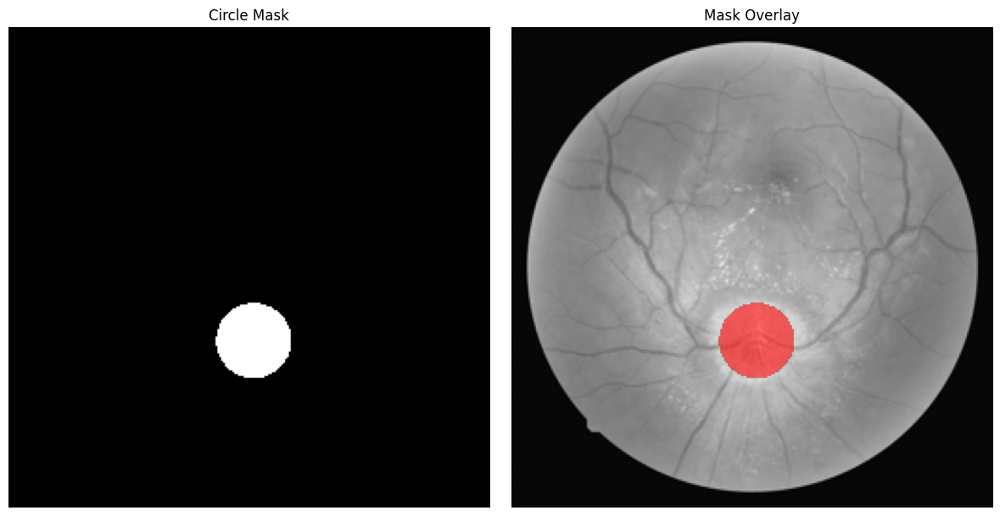

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [27]:
## making a circle around the centre point of the mask
from skimage.draw import disk as dsk

def circle_from_mask(image, full_mask, radius=10, visualise=False):
    image_normalized = normalize_np(image)
    shape = full_mask.shape

    labeled = label(full_mask)
    props = regionprops(labeled)
    if not props:
        raise ValueError("No objects found in full mask")
    centroid = props[0].centroid # (row,col)

    rr, cc = dsk(centroid, radius, shape=shape)
    circle_mask = np.zeros(shape, dtype=bool)
    circle_mask[rr, cc] = True

    if visualise:
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(circle_mask, cmap='gray')
        plt.title('Circle Mask')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(image_normalized, cmap='gray')
        plt.imshow(circle_mask, cmap=colors.ListedColormap(['none', 'red']), alpha=0.6)
        plt.title('Mask Overlay')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return circle_mask

circle_from_mask(A01_1, full_mask, radius=20, visualise=True)

### Mask of vessels

In [38]:
def vessel_mask(itk_image, threshold):
    # Zet ITK-image om naar NumPy
    image_np = itk.GetArrayViewFromImage(itk_image)

    # Zet om naar float voor Frangi
    image_float = img_as_float(image_np)

    # Pas Frangi toe
    frangi_img = frangi(image_float)

    # Gebruik opgegeven threshold om masker te maken
    vessel_mask = (frangi_img > threshold).astype(np.uint8)

    vessel_mask_itk = mask_to_itk(vessel_mask, itk_image)
    return vessel_mask_itk



### Mask of macula densa
The macula densa is the circular darker structure in the fundus

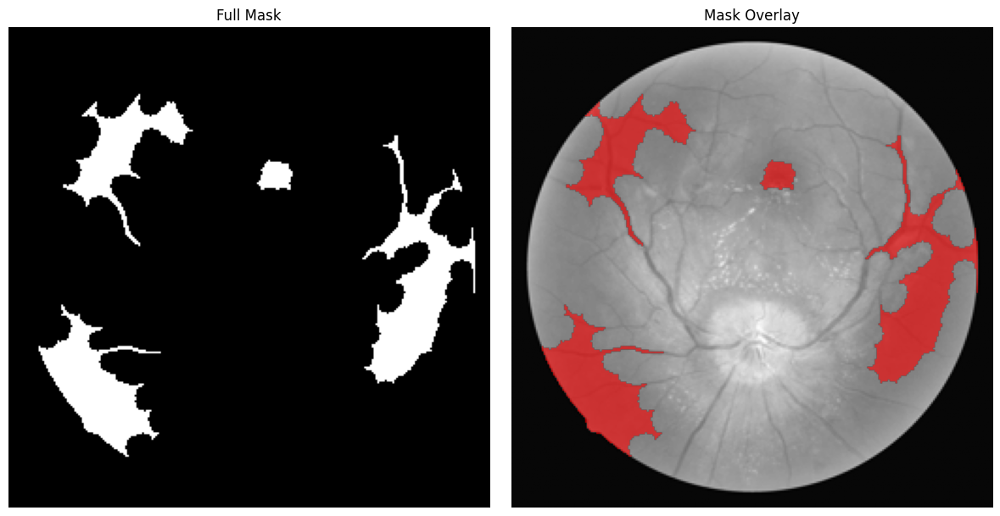

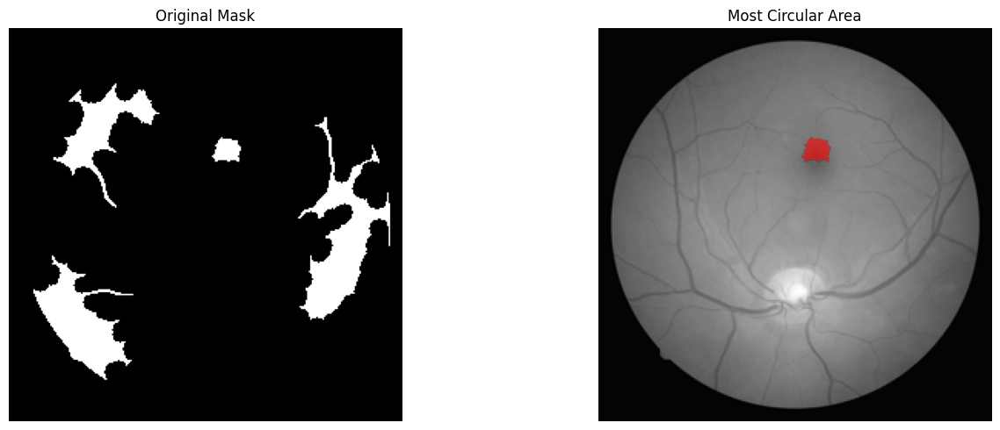

In [84]:
def macula_densa(image, threshold_lower=0.05, threshold_upper=0.3, min_size=200, visualise=False):
    image_normalized = normalize_np(image)
    mask = np.zeros(image_normalized.shape)
    mask[(image_normalized > threshold_lower) & (image_normalized < threshold_upper)] = 1
    image_masked = image_normalized * mask
    selem = disk(5)
    image_closed = closing(image_masked, selem)
    binary_closed = image_closed > 0
    full_mask = remove_small_objects(binary_closed, min_size)

    if visualise:
        plt.figure(figsize=(12, 6))

        # First subplot: Show the binary cleaned mask
        plt.subplot(1, 2, 1)  # (rows, columns, position)
        plt.imshow(full_mask, cmap='gray')
        plt.title('Full Mask')
        plt.axis('off')

        # Second subplot: Show the original image with the mask overlay
        plt.subplot(1, 2, 2)
        plt.imshow(image_normalized, cmap='gray')
        plt.imshow(full_mask, cmap=colors.ListedColormap(['none', 'red']), alpha=0.6)
        plt.title('Mask Overlay')
        plt.axis('off')

        # Show the plot
        plt.tight_layout()
        plt.show()
    return full_mask

def detect_most_circular_within_radius(image, binary_mask, radius=80, visualise=False, min_pixels=20):
    h, w = binary_mask.shape
    center = (w // 2, h // 2)

    # 1. Maak cirkel ROI mask en combineer met input mask
    roi_mask = np.zeros_like(binary_mask, dtype=np.uint8)
    cv2.circle(roi_mask, center, radius, color=1, thickness=-1)
    masked = cv2.bitwise_and(binary_mask.astype(np.uint8), roi_mask)

    # 2. Vind contours
    contours, _ = cv2.findContours(masked, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return np.zeros_like(binary_mask, dtype=np.uint8)

    # 3. Bereken circularity en selecteer meest circulaire contour
    best_circularity = 0
    best_contour = None

    for cnt in contours:
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        if perimeter == 0 or area < min_pixels:
            continue
        circularity = 4 * np.pi * (area / (perimeter ** 2))
        if circularity > best_circularity:
            best_circularity = circularity
            best_contour = cnt

    # 4. Maak leeg mask en teken het beste contour gevuld
    selected_mask = np.zeros_like(binary_mask, dtype=np.uint8)
    if best_contour is not None:
        area = cv2.contourArea(best_contour)
        if area >= min_pixels:
            cv2.drawContours(selected_mask, [best_contour], -1, color=1, thickness=-1)

    # 5. Visualisatie
    if visualise:
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 2, 1)
        plt.title("Original Mask")
        plt.imshow(binary_mask, cmap='gray')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Most Circular Area")
        plt.imshow(image, cmap='gray')
        plt.imshow(selected_mask, cmap=colors.ListedColormap(['none', 'red']), alpha=0.6)
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return selected_mask


full_mask = macula_densa(A01_1, threshold_lower=0.05, threshold_upper=0.5, min_size=200, visualise=True)
selected_mask = detect_most_circular_within_radius(P03_1, full_mask, radius=80, visualise=True, min_pixels=20)



# Registration

### Patient
A function to define the fixed and moving image. In the function, it is needed to fill in the paths to the data (as a string), e.g. 'A01_1.nii'

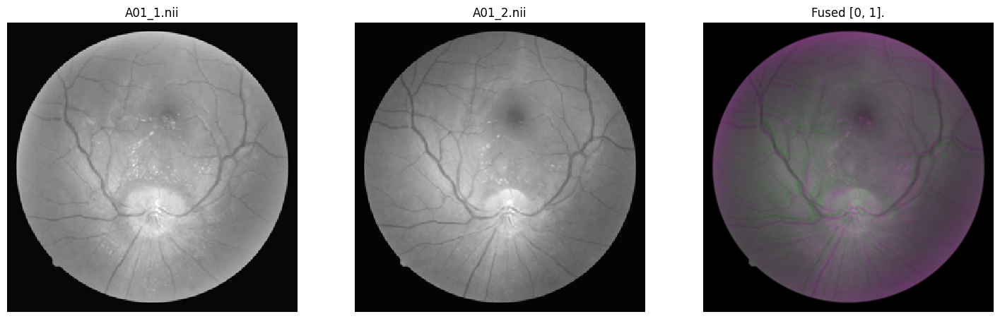

In [118]:
def show_registration_pair(fixed_path, moving_path, fundus_data, titles=None):
    fixed_im = itk.imread(fundus_data[fixed_path], itk.F)
    moving_im = itk.imread(fundus_data[moving_path], itk.F)

    if titles is None:
        titles = [fixed_path, moving_path]

    import aip.reg_tools  # ensure this is accessible in your environment
    aip.reg_tools.show_itkimages([fixed_im, moving_im], titles=titles, imfuse=[0, 1])

    return fixed_im, moving_im

fixed_im, moving_im = show_registration_pair('A01_1.nii', 'A01_2.nii', fundus_data)

## Registration without mask

The NC of the rigid transformation without mask is: 0.9681
The NC of the affine transformation without mask is: 0.9676
The NC of the bspline transformation without mask is: 0.9776
The NC of the stack transformation without mask is: 0.9676


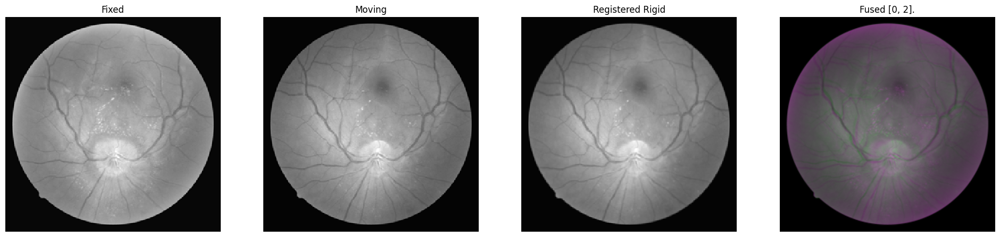

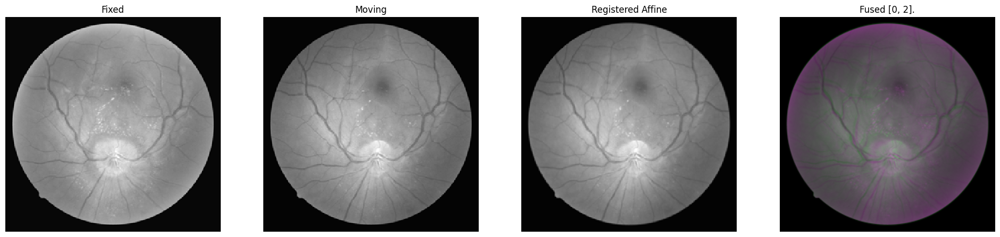

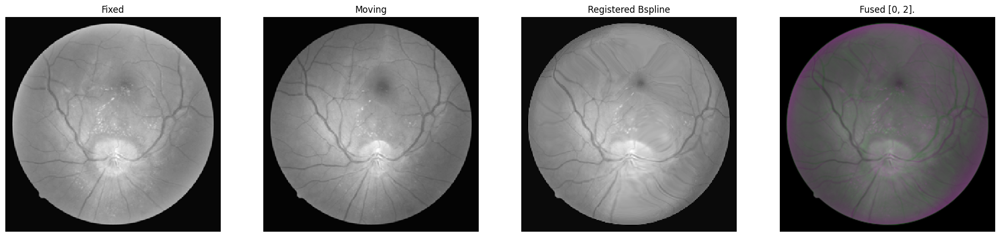

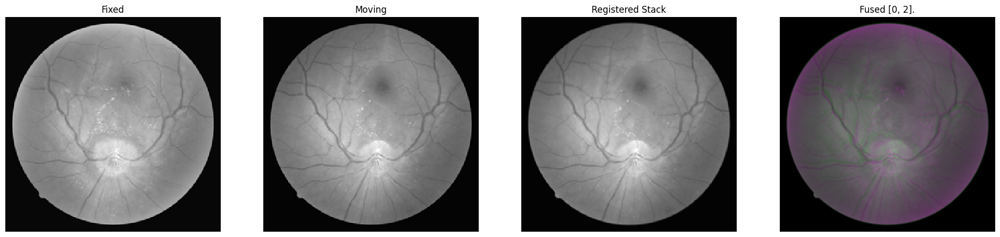

In [122]:
def register_images(fixed_im, moving_im):

    # output directories
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["AdvancedMeanSquares"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["100"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        fixed_im, moving_im,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rigid], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["AdvancedMeanSquares"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["100"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        fixed_im, moving_im,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_aff], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["AdvancedMeanSquares"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["100"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        fixed_im, moving_im,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_bspline], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    #parameter_object_stack.AddParameterMap(bspline_map)

    # Voer gecombineerde registratie uit
    result_im_stack, result_transform_stack = itk.elastix_registration_method(
        fixed_im, moving_im,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    titles = ['Fixed', 'Moving', 'Registered Stack']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_im_stack], titles=titles, imfuse=imfuse)

    return result_rigid, result_aff, result_bspline, result_im_stack

result_rigid, result_aff, result_bspline, result_im_stack = register_images(fixed_im, moving_im)

## Performance: normalized correlation
NC = solution_NC(fixed_im, result_rigid)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_aff)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_bspline)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_im_stack)
print(f"The NC of the stack transformation without mask is: {NC:.4f}")



## Registration with optical disk mask

The NC of the rigid transformation without mask is: 0.9074
The NC of the affine transformation without mask is: 0.9186
The NC of the bspline transformation without mask is: 0.9667
The NC of the stack transformation without mask is: 0.9135


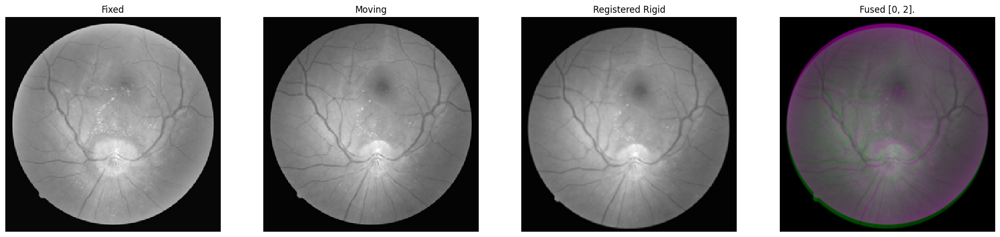

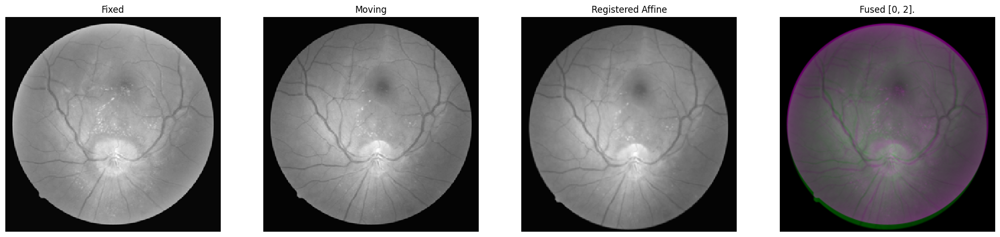

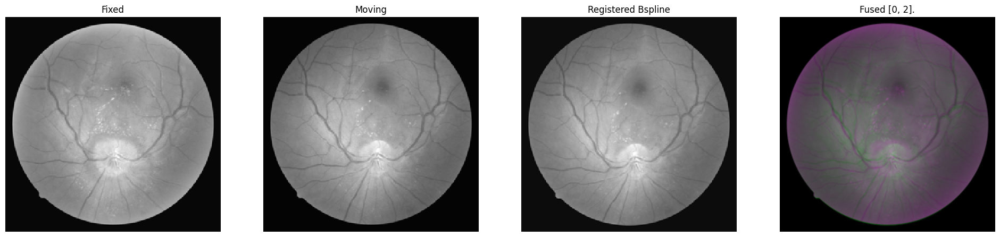

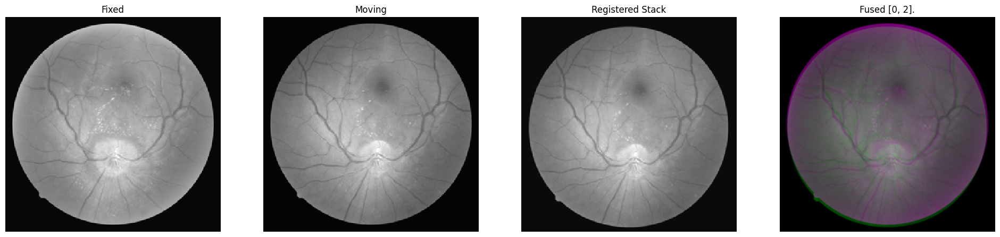

In [123]:
def register_with_optical_mask(fixed_im, moving_im, threshold=0.8, min_size=200, radius=10):

    fixed_mask = optical_disk_mask(fixed_im, threshold, min_size, visualise=False)
    moving_mask = optical_disk_mask(moving_im, threshold, min_size, visualise=False)

    circ_mask_fixed = circle_from_mask(fixed_im, fixed_mask, radius, visualise=False)
    circ_mask_moving = circle_from_mask(moving_im, moving_mask, radius, visualise=False)

    circ_mask_fixed_uc = mask_to_itk(circ_mask_fixed, fixed_im)
    circ_mask_moving_uc = mask_to_itk(circ_mask_moving, moving_im)

    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["AdvancedMeanSquares"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["100"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["LinearInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        circ_mask_fixed_uc, circ_mask_moving_uc,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform_o = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rigid_transform_o], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["AdvancedMeanSquares"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["100"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["LinearInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        circ_mask_fixed_uc, circ_mask_moving_uc,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform_o = itk.transformix_filter(
        moving_im,
        result_transform_parameters_aff)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_aff_transform_o], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["AdvancedMeanSquares"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["100"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["20.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["LinearInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        circ_mask_fixed_uc, circ_mask_moving_uc,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform_o = itk.transformix_filter(
        moving_im,
        result_transform_parameters_bspline)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_bspline_transform_o], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    parameter_object_stack.AddParameterMap(bspline_map)

    # Voer gecombineerde registratie uit
    result_im, result_transform_stack = itk.elastix_registration_method(
        circ_mask_fixed_uc, circ_mask_moving_uc,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    # Visualiseer resultaat
    result_im_transform_stack_o = itk.transformix_filter(
        moving_im,
        result_transform_stack)

    titles = ['Fixed', 'Moving', 'Registered Stack']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_im_transform_stack_o], titles=titles, imfuse=imfuse)

    return circ_mask_fixed_uc, circ_mask_moving_uc, result_rigid_transform_o, result_aff_transform_o, result_bspline_transform_o, result_im_transform_stack_o

circ_mask_fixed_uc, circ_mask_moving_uc, result_rigid_transform_o, result_aff_transform_o, result_bspline_transform_o, result_im_transform_stack_o = register_with_optical_mask(fixed_im, moving_im)

## Performance
# normalized correlation
NC = solution_NC(fixed_im, result_rigid_transform_o)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_aff_transform_o)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_bspline_transform_o)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_im_transform_stack_o)
print(f"The NC of the stack transformation without mask is: {NC:.4f}")



## Registration with vessel

The NC of the rigid transformation without mask is: -0.1926
The NC of the affine transformation without mask is: -0.1192
The NC of the bspline transformation without mask is: 0.9686
The NC of the stack transformation without mask is: 0.9686


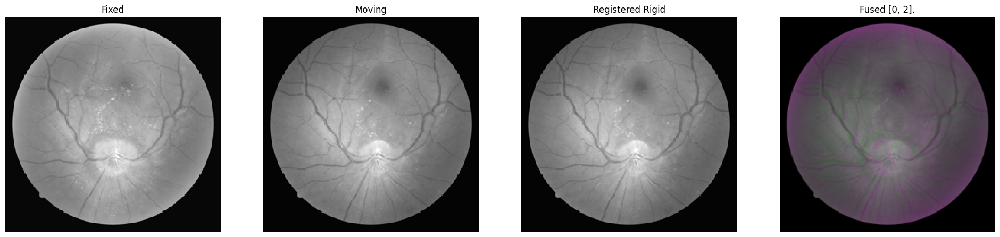

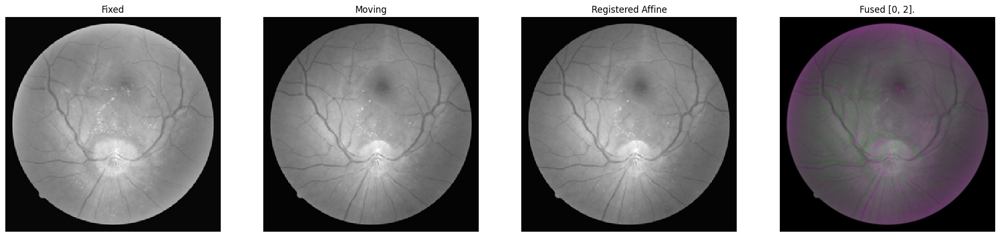

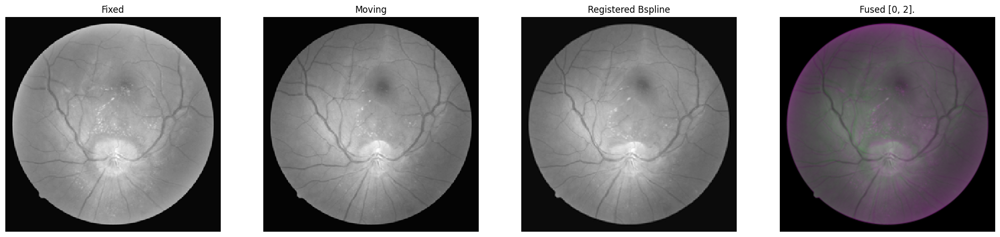

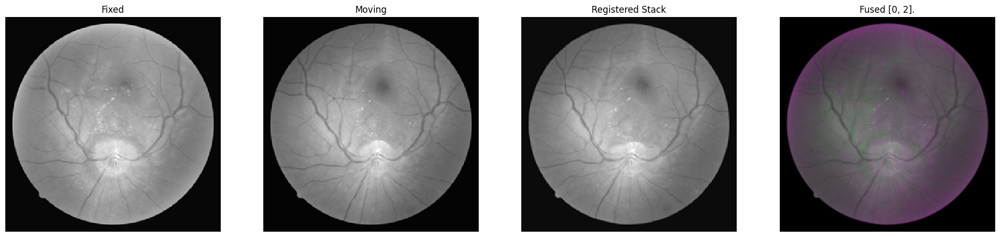

In [124]:
def register_with_vessels(fixed_im, moving_im):

    #mask of vessels
    vessel_mask_fixed_itk = vessel_mask(fixed_im, threshold=0.1)
    vessel_mask_moving_itk = vessel_mask(moving_im, threshold=0.1)

    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["NormalizedMutualInformation"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["250"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform_v = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rigid_transform_v], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["NormalizedMutualInformation"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["250"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform_v = itk.transformix_filter(
        moving_im,
        result_transform_parameters_aff)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_aff_transform_v], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["NormalizedMutualInformation"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["300"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform_v = itk.transformix_filter(
        moving_im,
        result_transform_parameters_bspline)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_bspline_transform_v], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    parameter_object_stack.AddParameterMap(bspline_map)

    # Voer gecombineerde registratie uit
    result_im, result_transform_stack = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    # Visualiseer resultaat
    result_im_transform_stack_v = itk.transformix_filter(
        moving_im,
        result_transform_stack)

    titles = ['Fixed', 'Moving', 'Registered Stack']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_im_transform_stack_v], titles=titles, imfuse=imfuse)

    return vessel_mask_fixed_itk, vessel_mask_moving_itk, result_rigid_transform_v, result_aff_transform_v, result_bspline_transform_v, result_im_transform_stack_v

result_rigid_transform_v, result_aff_transform_v, result_bspline_transform_v, result_im_transform_stack_v, vessel_mask_fixed_itk, vessel_mask_moving_itk = register_with_vessels(fixed_im, moving_im)

## Performance
# normalized correlation
NC = solution_NC(fixed_im, result_rigid_transform_v)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_aff_transform_v)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_bspline_transform_v)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_im_transform_stack_v)
print(f"The NC of the stack transformation without mask is: {NC:.4f}")



## Registration with macula densa

The NC of the rigid transformation without mask is: 0.9687
The NC of the affine transformation without mask is: 0.8767
The NC of the bspline transformation without mask is: 0.9613


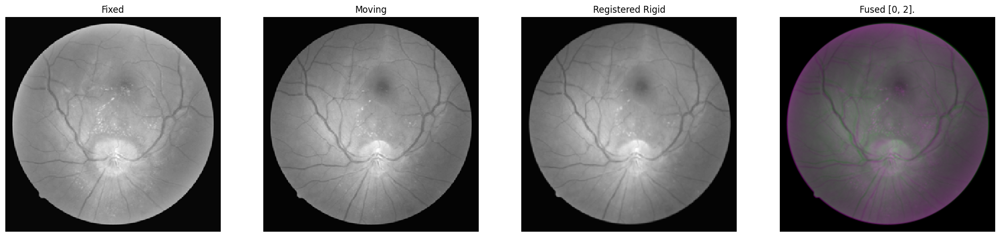

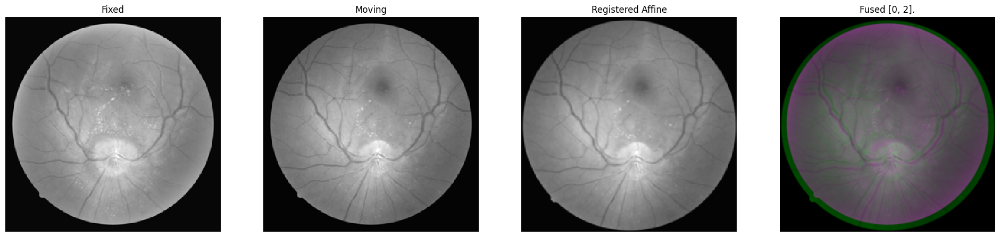

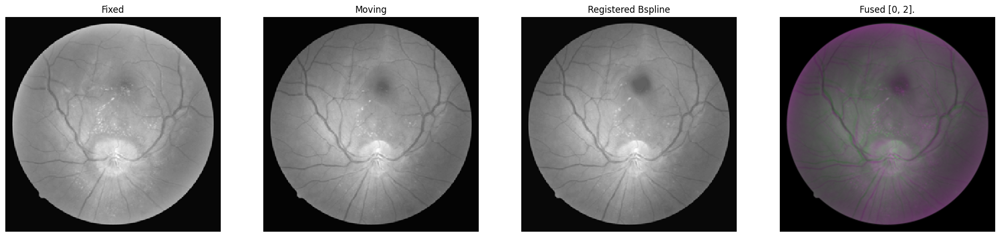

In [125]:

def register_with_macula(fixed_im, moving_im, threshold_lower=0.05, threshold_upper=0.5, min_size=200, radius_region=80, min_pixels=20, radius=10):

    # mask of macula_densa
    full_mask_fixed = macula_densa(fixed_im, threshold_lower, threshold_upper, min_size, visualise=False)
    macula_densa_region_fixed = detect_most_circular_within_radius(fixed_im, full_mask_fixed, radius_region, visualise=False, min_pixels=20)
    circ_macula_densa_fixed = circle_from_mask(fixed_im, macula_densa_region_fixed, radius, visualise=False)
    macula_fixed_itk = mask_to_itk(circ_macula_densa_fixed, fixed_im)

    full_mask_moving = macula_densa(moving_im, threshold_lower, threshold_upper, min_size, visualise=False)
    macula_densa_region_moving = detect_most_circular_within_radius(moving_im, full_mask_moving, radius_region, visualise=False, min_pixels=20)
    circ_macula_densa_moving = circle_from_mask(moving_im, macula_densa_region_moving, radius, visualise=False)
    macula_moving_itk = mask_to_itk(circ_macula_densa_moving, moving_im)

    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["NormalizedMutualInformation"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["250"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        macula_fixed_itk, macula_moving_itk,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform_m = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rigid_transform_m], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["NormalizedMutualInformation"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["250"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        macula_fixed_itk, macula_moving_itk,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform_m = itk.transformix_filter(
        moving_im,
        result_transform_parameters_aff)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_aff_transform_m], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["NormalizedMutualInformation"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["300"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        macula_fixed_itk, macula_moving_itk,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform_m = itk.transformix_filter(
        moving_im,
        result_transform_parameters_bspline)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_bspline_transform_m], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    parameter_object_stack.AddParameterMap(bspline_map)

    # Voer gecombineerde registratie uit
    result_im, result_transform_stack = itk.elastix_registration_method(
        macula_fixed_itk, macula_moving_itk,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    return macula_fixed_itk, macula_moving_itk, result_bspline_transform_m, result_aff_transform_m, result_rigid_transform_m

macula_fixed_itk, macula_moving_itk, result_rigid_transform_m, result_aff_transform_m, result_bspline_transform_m = register_with_macula(fixed_im, moving_im, threshold_lower=0.05, threshold_upper=0.5, min_size=200, radius_region=80, min_pixels=20, radius=10)

NC = solution_NC(fixed_im, result_rigid_transform_m)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_aff_transform_m)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_bspline_transform_m)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")





## Optical Disk + macula densa

In [126]:
def combine_binary_masks(mask1, mask2):
    """
    Combine two binary masks (same size) by logical OR operation.

    Parameters:
        mask1 (ndarray): First binary mask (0s and 1s).
        mask2 (ndarray): Second binary mask (0s and 1s).

    Returns:
        ndarray: Combined binary mask (0s and 1s).
    """
    if mask1.shape != mask2.shape:
        raise ValueError("Masks must have the same shape")

    combined = np.logical_or(mask1, mask2).astype(np.uint8)
    return combined


# Voorbeeld aanroepen:
combined_fixed_mask = combine_binary_masks(circ_mask_fixed_uc, macula_fixed_itk)
combined_moving_mask = combine_binary_masks(circ_mask_moving_uc, macula_moving_itk)

combined_fixed_mask_total = combine_binary_masks(combined_fixed_mask, vessel_mask_fixed_itk)
combined_moving_mask_total = combine_binary_masks(combined_moving_mask, vessel_mask_moving_itk)



## Registration with optical disk + macula densa

The NC of the rigid transformation without mask is: 0.9553
The NC of the affine transformation without mask is: 0.8567
The NC of the bspline transformation without mask is: 0.9676


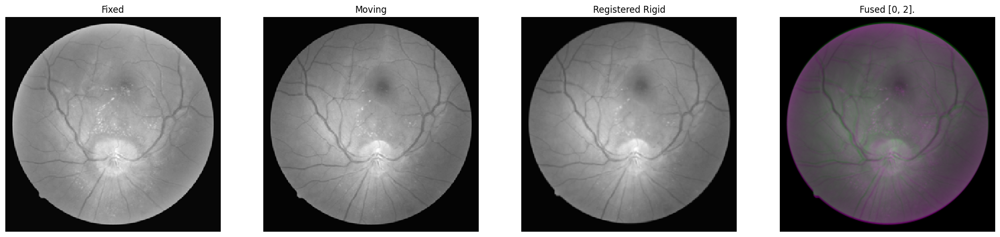

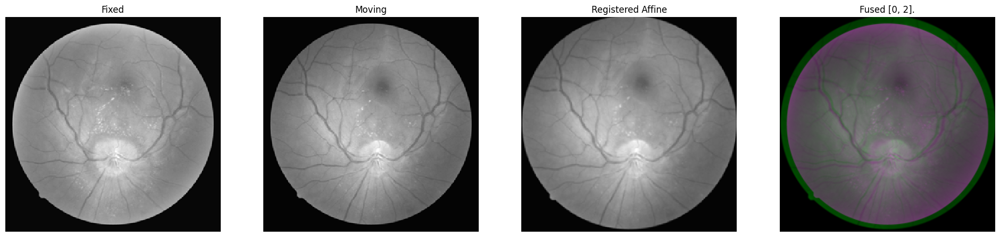

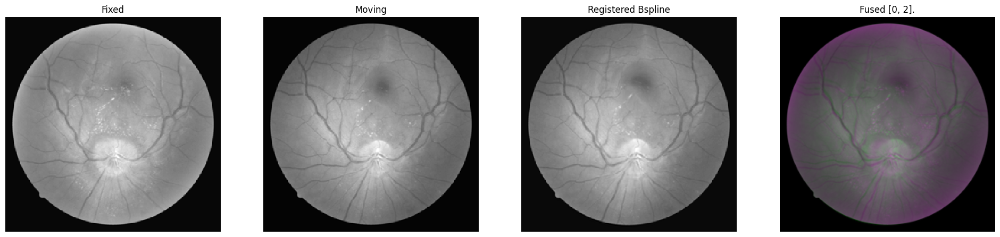

In [127]:
def rotate_180(image):
    flip_filter = itk.FlipImageFilter.New(image)
    flip_axes = [True, True]
    flip_filter.SetFlipAxes(flip_axes)
    flip_filter.SetInput(image)
    flip_filter.Update()
    return flip_filter.GetOutput()

def register_with_optical_and_macula(fixed_im, moving_im, circ_mask_fixed_uc, macula_fixed_itk, circ_mask_moving_uc, macula_moving_itk):

    combined_fixed_mask = combine_binary_masks(circ_mask_fixed_uc, macula_fixed_itk)
    combined_moving_mask = combine_binary_masks(circ_mask_moving_uc, macula_moving_itk)

    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["NormalizedMutualInformation"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["250"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        combined_fixed_mask, combined_moving_mask,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    result_rotated_rigid_om = rotate_180(result_rigid_transform)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_rigid_om], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["NormalizedMutualInformation"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["250"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        combined_fixed_mask, combined_moving_mask,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_aff)

    result_rotated_aff_om = rotate_180(result_aff_transform)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_aff_om], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["NormalizedMutualInformation"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["300"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        combined_fixed_mask, combined_moving_mask,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_bspline)

    result_rotated_bspline_om = rotate_180(result_bspline_transform)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_bspline_om], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    parameter_object_stack.AddParameterMap(bspline_map)

    # Voer gecombineerde registratie uit
    result_im, result_transform_stack = itk.elastix_registration_method(
        combined_fixed_mask, combined_moving_mask,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    return result_rotated_rigid_om, result_rotated_aff_om, result_rotated_bspline_om

result_rotated_rigid_om, result_rotated_aff_om, result_rotated_bspline_om = register_with_optical_and_macula(fixed_im, moving_im, circ_mask_fixed_uc, macula_fixed_itk, circ_mask_moving_uc, macula_moving_itk)

NC = solution_NC(fixed_im, result_rotated_rigid_om)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_rotated_aff_om)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_rotated_bspline_om)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")



## Registration with combination of all masks

The NC of the rigid transformation without mask is: 0.9490
The NC of the affine transformation without mask is: 0.5927
The NC of the bspline transformation without mask is: 0.9669


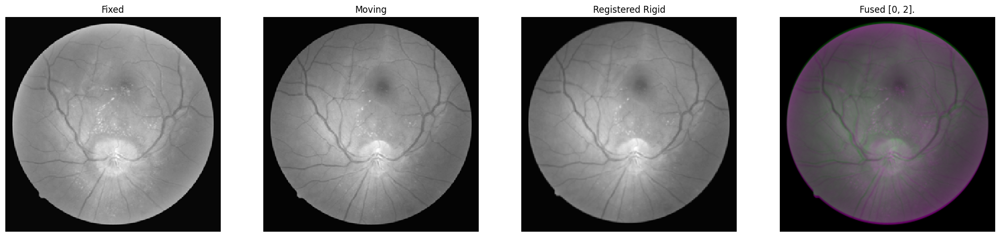

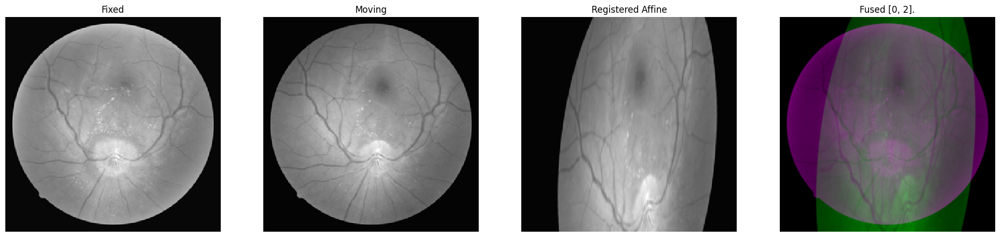

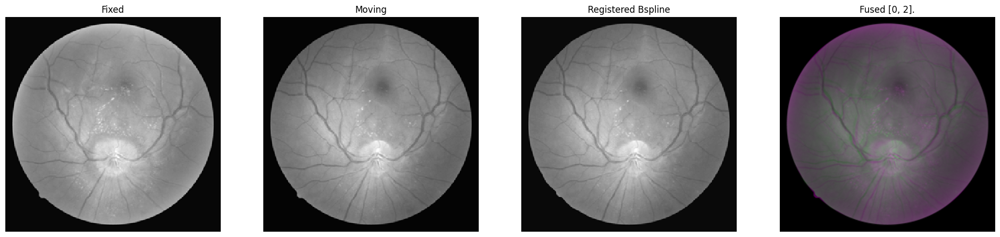

In [128]:
def register_with_masks_total(fixed_im, moving_im, circ_mask_fixed_uc, macula_fixed_itk, circ_mask_moving_uc, macula_moving_itk, vessel_mask_fixed_itk, vessel_mask_moving_itk):

    combined_fixed_mask = combine_binary_masks(circ_mask_fixed_uc, macula_fixed_itk)
    combined_moving_mask = combine_binary_masks(circ_mask_moving_uc, macula_moving_itk)

    combined_fixed_mask_total = combine_binary_masks(combined_fixed_mask, vessel_mask_fixed_itk)
    combined_moving_mask_total = combine_binary_masks(combined_moving_mask, vessel_mask_moving_itk)

    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["NormalizedMutualInformation"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["250"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        combined_fixed_mask_total, combined_moving_mask_total,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    result_rotated_rigid_c = rotate_180(result_rigid_transform)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_rigid_c], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["NormalizedMutualInformation"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["250"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        combined_fixed_mask_total, combined_moving_mask_total,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_aff)

    result_rotated_aff_c = rotate_180(result_aff_transform)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_aff_c], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["NormalizedMutualInformation"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["300"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        combined_fixed_mask_total, combined_moving_mask_total,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform = itk.transformix_filter(
        moving_im,
        result_transform_parameters_bspline)

    result_rotated_bspline_c = rotate_180(result_bspline_transform)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rotated_bspline_c], titles=titles, imfuse=imfuse)

    # Combineer alle parameter maps in één object
    parameter_object_stack = itk.ParameterObject.New()
    parameter_object_stack.AddParameterMap(rigid_map)
    parameter_object_stack.AddParameterMap(affine_map)
    parameter_object_stack.AddParameterMap(bspline_map)


    # Voer gecombineerde registratie uit
    result_im, result_transform_stack = itk.elastix_registration_method(
        combined_fixed_mask_total, combined_moving_mask_total,
        parameter_object=parameter_object_stack,
        log_to_file=True,
        output_directory=outputfolder,
        log_file_name=log_file_name
    )

    return result_rotated_aff_c, result_rotated_bspline_c, result_rotated_rigid_c

result_rotated_aff_c, result_rotated_bspline_c, result_rotated_rigid_c = register_with_masks_total(A01_1, A01_2, circ_mask_fixed_uc, macula_fixed_itk, circ_mask_moving_uc, macula_moving_itk, vessel_mask_fixed_itk, vessel_mask_moving_itk)

NC = solution_NC(fixed_im, result_rotated_rigid_c)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_rotated_aff_c)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_rotated_bspline_c)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")


## Registration with first the optical disk and then the vessels
The optical disk is rigidly transformed. Thereafter, the result of this is transform with affine registration. On this result, bspline registration is performed.

The NC of the rigid transformation without mask is: 0.9123
The NC of the affine transformation without mask is: 0.9129
The NC of the bspline transformation without mask is: 0.9060


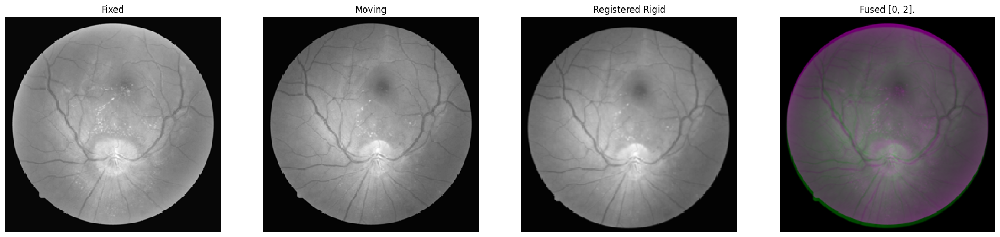

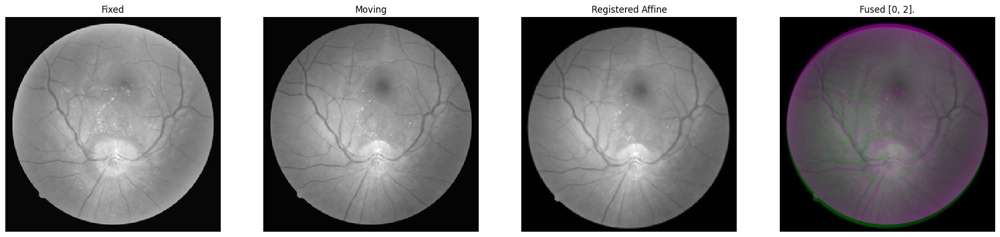

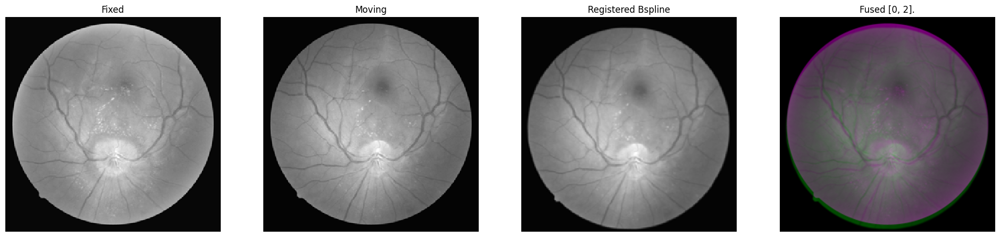

In [130]:
def register_optical_vessels(fixed_im, moving_im, circ_mask_moving_uc, circ_mask_fixed_uc, vessel_mask_fixed_itk, vessel_mask_moving_itk):
    # output directory
    rigid_output = os.path.join(outputfolder, "rigid")
    affine_output = os.path.join(outputfolder, "affine")
    bspline_output = os.path.join(outputfolder, "bspline")

    os.makedirs(rigid_output, exist_ok=True)
    os.makedirs(affine_output, exist_ok=True)
    os.makedirs(bspline_output, exist_ok=True)

    # Laad en configureer rigid parameters
    rigid_map = itk.ParameterObject.New().GetDefaultParameterMap("rigid")
    rigid_map["Metric"] = ["NormalizedMutualInformation"]
    rigid_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    rigid_map["MaximumNumberOfIterations"] = ["250"]
    rigid_map["NumberOfResolutions"] = ["4"]
    rigid_map["NumberOfSpatialSamples"] = ["2048"]
    rigid_map["Interpolator"] = ["BSplineInterpolator"]
    rigid_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_rigid = itk.ParameterObject.New()
    parameter_object_rigid.AddParameterMap(rigid_map)

    result_rigid, result_transform_parameters_rid = itk.elastix_registration_method(
        circ_mask_fixed_uc, circ_mask_moving_uc,
        parameter_object=parameter_object_rigid,
        output_directory=rigid_output,
        log_file_name="log_rigid.txt"
    )

    result_rigid_transform_d = itk.transformix_filter(
        moving_im,
        result_transform_parameters_rid)

    titles = ['Fixed', 'Moving', 'Registered Rigid']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_rigid_transform_d], titles=titles, imfuse=imfuse)

    # Laad en configureer affine parameters
    affine_map = itk.ParameterObject.New().GetDefaultParameterMap("affine")
    affine_map["Metric"] = ["NormalizedMutualInformation"]
    affine_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    affine_map["MaximumNumberOfIterations"] = ["250"]
    affine_map["NumberOfResolutions"] = ["3"]
    affine_map["NumberOfSpatialSamples"] = ["2048"]
    affine_map["Interpolator"] = ["BSplineInterpolator"]
    affine_map["FinalBSplineInterpolationOrder"] = ["1"]

    parameter_object_affine = itk.ParameterObject.New()
    parameter_object_affine.AddParameterMap(affine_map)

    result_aff, result_transform_parameters_aff = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_affine,
        output_directory=affine_output,
        log_file_name="log_affine.txt"
    )

    result_aff_transform_d = itk.transformix_filter(
        result_rigid_transform_d,
        result_transform_parameters_aff)

    titles = ['Fixed', 'Moving', 'Registered Affine']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_aff_transform_d], titles=titles, imfuse=imfuse)

    # Laad en configureer B-spline parameters
    bspline_map = itk.ParameterObject.New().GetDefaultParameterMap("bspline")
    bspline_map["Metric"] = ["NormalizedMutualInformation"]
    bspline_map["Optimizer"] = ["AdaptiveStochasticGradientDescent"]
    bspline_map["MaximumNumberOfIterations"] = ["300"]
    bspline_map["FinalGridSpacingInPhysicalUnits"] = ["10.0"]
    bspline_map["NumberOfSpatialSamples"] = ["2048"]
    bspline_map["Interpolator"] = ["BSplineInterpolator"]
    bspline_map["FinalBSplineInterpolationOrder"] = ["3"]

    parameter_object_bspline = itk.ParameterObject.New()
    parameter_object_bspline.AddParameterMap(bspline_map)

    result_bspline, result_transform_parameters_bspline = itk.elastix_registration_method(
        vessel_mask_fixed_itk, vessel_mask_moving_itk,
        parameter_object=parameter_object_bspline,
        output_directory=bspline_output,
        log_file_name="log_bspline.txt"
    )

    result_bspline_transform_d = itk.transformix_filter(
        result_aff_transform_d,
        result_transform_parameters_bspline)

    titles = ['Fixed', 'Moving', 'Registered Bspline']
    imfuse = [0, 2]
    aip.reg_tools.show_itkimages([fixed_im, moving_im, result_bspline_transform_d], titles=titles, imfuse=imfuse)

    return result_bspline_transform_d, result_aff_transform_d, result_rigid_transform_d

result_bspline_transform_d, result_aff_transform_d, result_rigid_transform_d = register_optical_vessels(A01_1, A01_2, circ_mask_moving_uc, circ_mask_fixed_uc, vessel_mask_fixed_itk, vessel_mask_moving_itk)


NC = solution_NC(fixed_im, result_rigid_transform_d)
print(f"The NC of the rigid transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_aff_transform_d)
print(f"The NC of the affine transformation without mask is: {NC:.4f}")

NC = solution_NC(fixed_im, result_bspline_transform_d)
print(f"The NC of the bspline transformation without mask is: {NC:.4f}")